In [2]:
import spacy

#! python -m spacy download en_core_web_lg
nlp = spacy.load("en_core_web_lg")


2022-08-16 10:58:42.405595: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-16 10:58:42.405616: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [3]:
import numpy

times_samples = 100

texts = ["rasberry", "strawberry", "cucumber", "programming", "building", "house", "city",
         "society", "barrack", "castle", "tower", "computer", "wall", "electricity", "irrigation", "architecture",
         "noodle", "bread", "gras", "river", "wheat", "rice", "culture", "nature", "vegetable", "onion", "fruit",
         "garlic", "cheese", "melon", "grapefruit"]
texts = [(text.lower()) for text in texts]
original_texts = texts
docs = [nlp(text.lower()) for text in texts]
vectors = [doc.vector for doc in docs]
embeddings = numpy.vstack(vectors)

from sklearn.decomposition import PCA

n_components = 15
pca = PCA(n_components)
dn_embeddings = pca.fit_transform(embeddings)

similarities = [[doc1.similarity(doc2) for doc2 in docs] for doc1 in docs]
similarities = vectors

# gaussian noise
percentage = 0.00
embeddings = dn_embeddings
for i in range(times_samples):
    new_vectors = numpy.random.normal(0, dn_embeddings.std(), dn_embeddings.shape) * percentage
    print(embeddings.shape, new_vectors.shape)
    new_vectors = new_vectors + dn_embeddings
    embeddings = numpy.vstack([embeddings, new_vectors])
texts = texts * (times_samples + 1)

print(texts.__len__())
print(embeddings.shape)
print(embeddings[:16])
print(dn_embeddings.std())

(31, 15) (31, 15)
(62, 15) (31, 15)
(93, 15) (31, 15)
(124, 15) (31, 15)
(155, 15) (31, 15)
(186, 15) (31, 15)
(217, 15) (31, 15)
(248, 15) (31, 15)
(279, 15) (31, 15)
(310, 15) (31, 15)
(341, 15) (31, 15)
(372, 15) (31, 15)
(403, 15) (31, 15)
(434, 15) (31, 15)
(465, 15) (31, 15)
(496, 15) (31, 15)
(527, 15) (31, 15)
(558, 15) (31, 15)
(589, 15) (31, 15)
(620, 15) (31, 15)
(651, 15) (31, 15)
(682, 15) (31, 15)
(713, 15) (31, 15)
(744, 15) (31, 15)
(775, 15) (31, 15)
(806, 15) (31, 15)
(837, 15) (31, 15)
(868, 15) (31, 15)
(899, 15) (31, 15)
(930, 15) (31, 15)
(961, 15) (31, 15)
(992, 15) (31, 15)
(1023, 15) (31, 15)
(1054, 15) (31, 15)
(1085, 15) (31, 15)
(1116, 15) (31, 15)
(1147, 15) (31, 15)
(1178, 15) (31, 15)
(1209, 15) (31, 15)
(1240, 15) (31, 15)
(1271, 15) (31, 15)
(1302, 15) (31, 15)
(1333, 15) (31, 15)
(1364, 15) (31, 15)
(1395, 15) (31, 15)
(1426, 15) (31, 15)
(1457, 15) (31, 15)
(1488, 15) (31, 15)
(1519, 15) (31, 15)
(1550, 15) (31, 15)
(1581, 15) (31, 15)
(1612, 15) (31,

In [4]:
#! pip install whatlies
from whatlies.language import SpacyLanguage

lang = SpacyLanguage('en_core_web_md')

emb = lang[original_texts]
emb.plot_interactive(x_axis='nature', y_axis='culture')

alt.LayerChart(...)

In [5]:
from sklearn.decomposition import PCA

n_components = 2

pca = PCA(n_components)
d2_embeddings = pca.fit_transform(embeddings)

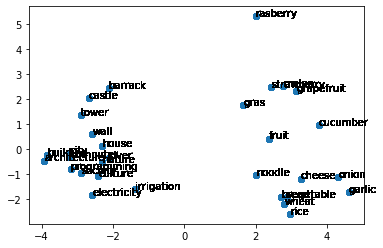

In [6]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots()
x, y = d2_embeddings[:, 0], d2_embeddings[:, 1]
ax.scatter(x, y)

for i, txt in enumerate(texts):
    ax.annotate(txt, (x[i], y[i]))

In [7]:
d2_embeddings

array([[ 1.99727143,  5.3062851 ],
       [ 2.43684641,  2.48072638],
       [ 3.76549033,  0.95047733],
       ...,
       [ 3.26763009, -1.19052506],
       [ 2.75757807,  2.51655604],
       [ 3.13642035,  2.31170594]])

In [37]:



def analogy(a_s, b_s, c_s):
    ms = nlp.vocab.vectors.most_similar(
        numpy.asarray([numpy.mean([nlp(a).vector - nlp(b).vector for a, b in zip(a_s, b_s)], axis=0) + numpy.mean([nlp(c).vector for c in c_s], axis=0)]),
        n=50, sort=True)
    d_s = [nlp.vocab.strings[w].lower() for w in ms[0][0]]
    d_s = set([w for w in d_s if w not in a_s and w not in  b_s and w not in c_s])
    return d_s

a_s = ["apple"]
b_s = ["fruit"] * len(a_s)
c = ["onion", "tomato", "potato", "cucumber", "garlic", "celery", "dill", "parsley", "onions" , "shallot", "chives", "paprika", "fennel", "scallions"]
print(analogy(a_s, b_s, c))

a_s = ["onion", "tomato", "potato", "cucumber"]
b_s = ["vegetable"] * len(a_s)
c = ["apple", "banana", "strawberry"]
print(analogy(a_s, b_s, c))

{'tarragon', 'shallots', 'scallion', 'thyme', 'cilantro', 'parmesan'}
{'watermelon', 'pineapple', 'peaches', 'peach', 'strawberries', 'mango', 'apples', 'pear', 'raspberry', 'cherry', 'lemon', 'blueberry'}


In [9]:

import pandas

X = pandas.DataFrame(embeddings)

y = texts
X.head()

df = pandas.DataFrame({"texts": texts})
df["texts"] = texts

In [10]:
df

,texts
0,rasberry
1,strawberry
2,cucumber
3,programming
4,building
...,...
3126,fruit
3127,garlic
3128,cheese
3129,melon


In [11]:
from sklearn.tree import DecisionTreeClassifier  # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split  # Import train_test_split function
from sklearn import metrics  #Import scikit-learn metrics module for accuracy calculation

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, df, test_size=0.1,
                                                    random_state=1)
y_test

,texts
2961,noodle
110,bread
1225,noodle
517,rice
340,grapefruit
...,...
2496,noodle
2916,cucumber
299,wheat
2820,grapefruit


In [13]:

# Train Decision Tree Classifer

clf = DecisionTreeClassifier(min_samples_split=2)
clf = clf.fit(X_train[:50], y_train[:50])

#Predict the response for test dataset
y_pred = clf.predict(X_test)
print(f"Accuracy: {metrics.accuracy_score(y_test, y_pred)}")

Accuracy: 0.8312101910828026


In [14]:
X_train

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
2431,-2.585148,-1.874121,0.372246,2.972013,-1.675760,0.460714,-0.782041,-0.709712,3.357742,1.157808,-1.003440,-0.533073,-1.367133,0.396048,1.927230
816,-2.900414,1.344884,-2.664061,-0.056790,-1.166800,-1.176868,-0.336296,0.885297,-0.487372,0.482303,0.740918,0.493794,-1.172894,-0.356127,0.118160
2164,4.314389,-1.122808,-0.961879,-1.766610,-0.654634,-0.113890,1.076340,1.132341,1.478883,-0.577089,1.294649,-0.299903,0.031635,0.128503,-0.061523
2455,-3.210141,-0.182061,-1.395932,-0.009825,2.065576,0.334210,-0.589829,0.037760,0.306692,-0.608092,0.194875,-1.680580,-1.814782,-1.298886,-2.085046
785,-2.900414,1.344884,-2.664061,-0.056790,-1.166800,-1.176868,-0.336296,0.885297,-0.487372,0.482303,0.740918,0.493794,-1.172894,-0.356127,0.118160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2763,-3.840551,-0.232702,-1.058275,0.270978,-1.172857,-1.207146,0.737107,-0.681411,-0.314267,0.725144,0.300888,-0.383955,-0.957321,-1.315321,-0.233909
905,-3.210141,-0.182061,-1.395932,-0.009825,2.065576,0.334210,-0.589829,0.037760,0.306692,-0.608092,0.194875,-1.680580,-1.814782,-1.298886,-2.085046
1096,-3.199600,-0.306852,1.914921,-1.024625,-3.118694,-0.032374,-1.838633,0.499338,0.227288,-1.992641,-0.768379,0.488648,0.413210,0.017294,-1.331875
235,1.652447,1.770892,-0.149378,-1.457754,1.823689,2.853053,-1.952270,2.243685,0.793389,3.633009,-0.899228,0.521297,0.469148,-1.060153,-0.309286


In [15]:
#!pip install graphviz

#!pip install pydotplus

In [16]:
from sklearn import tree

text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_2 <= -2.24
|   |--- feature_1 <= 1.68
|   |   |--- class: tower
|   |--- feature_1 >  1.68
|   |   |--- class: castle
|--- feature_2 >  -2.24
|   |--- feature_0 <= 3.79
|   |   |--- feature_13 <= -1.39
|   |   |   |--- class: grapefruit
|   |   |--- feature_13 >  -1.39
|   |   |   |--- feature_10 <= -1.81
|   |   |   |   |--- class: noodle
|   |   |   |--- feature_10 >  -1.81
|   |   |   |   |--- feature_13 <= -1.31
|   |   |   |   |   |--- class: building
|   |   |   |   |--- feature_13 >  -1.31
|   |   |   |   |   |--- feature_8 <= -1.90
|   |   |   |   |   |   |--- class: architecture
|   |   |   |   |   |--- feature_8 >  -1.90
|   |   |   |   |   |   |--- feature_5 <= 2.74
|   |   |   |   |   |   |   |--- feature_0 <= -3.20
|   |   |   |   |   |   |   |   |--- class: city
|   |   |   |   |   |   |   |--- feature_0 >  -3.20
|   |   |   |   |   |   |   |   |--- feature_7 <= -2.02
|   |   |   |   |   |   |   |   |   |--- class: wheat
|   |   |   |   |   |   |   |   |--- f

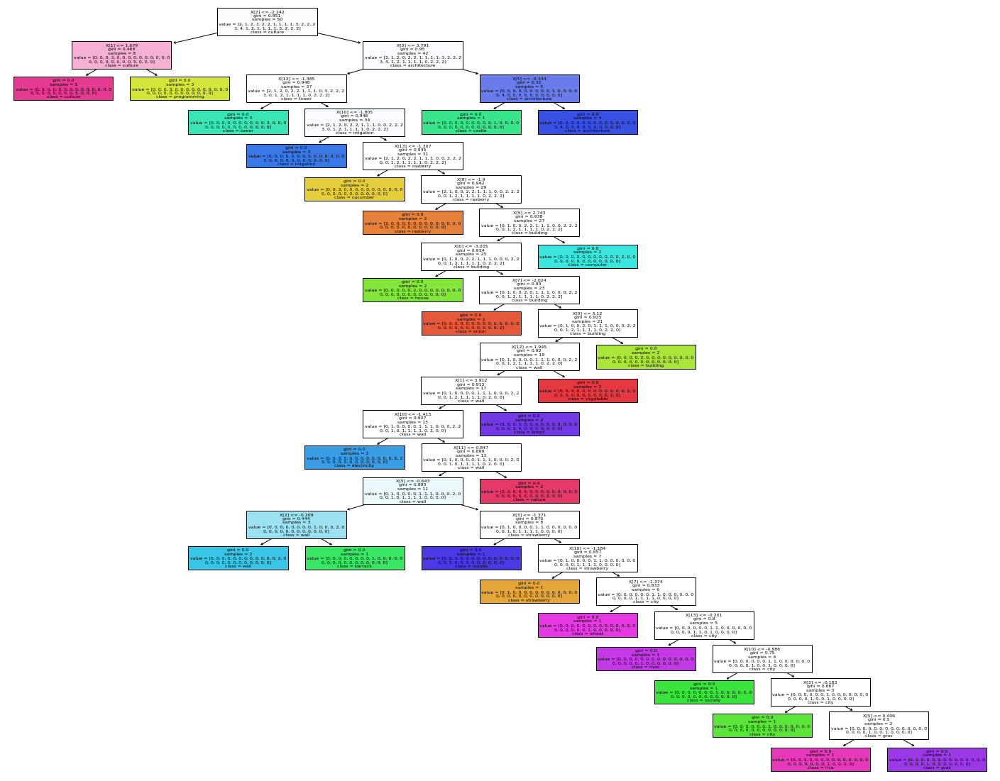

In [17]:
fig = plt.figure(figsize=(25, 20))
_ = tree.plot_tree(clf,
                   class_names=texts,
                   filled=True)


In [18]:
import lightgbm as lgb

# create dataset for lightgbm
labels_train = y_train.texts.astype("category").cat.codes
labels_test = y_test.texts.astype("category").cat.codes

print(labels_train.size, X_train.shape)
lgb_train = lgb.Dataset(X_train, labels_train, categorical_feature=y_train)
lgb_eval = lgb.Dataset(X_test, categorical_feature=y_test)

print('Starting training...')
# train
model = lgb.LGBMClassifier(boosting_type='goss', num_leaves=50,
                           learning_rate=0.01, n_estimators=30,
                           #reg_lambda=0.002,
                           #min_split_gain=0.001,
                           importance_type="split", force_row_wise=True,
                           linear_tree=True, min_child_weight=0.0004, min_child_samples=1

                           )

model = model.fit(X_train, labels_train)

pred = model.predict(X_test)

print(list(zip(labels_test.tolist(), pred)))

original_texts

2817 (2817, 15)
Starting training...
[(19, 19), (2, 2), (19, 19), (23, 23), (13, 13), (2, 2), (13, 13), (11, 11), (25, 25), (8, 8), (12, 12), (5, 5), (22, 22), (10, 10), (26, 26), (26, 26), (23, 23), (13, 13), (8, 8), (10, 10), (16, 16), (7, 7), (14, 14), (20, 20), (19, 19), (27, 27), (25, 25), (14, 14), (10, 10), (18, 18), (23, 23), (2, 2), (15, 15), (6, 6), (8, 8), (23, 23), (18, 18), (17, 17), (24, 24), (10, 10), (7, 7), (26, 26), (27, 27), (3, 3), (25, 25), (13, 13), (28, 28), (18, 18), (7, 7), (13, 13), (6, 6), (28, 28), (21, 21), (29, 29), (21, 21), (7, 7), (15, 15), (27, 27), (22, 22), (8, 8), (20, 20), (14, 14), (30, 30), (20, 20), (24, 24), (26, 26), (10, 10), (16, 16), (23, 23), (5, 5), (22, 22), (18, 18), (21, 21), (8, 8), (22, 22), (29, 29), (27, 27), (22, 22), (16, 16), (12, 12), (23, 23), (11, 11), (10, 10), (4, 4), (6, 6), (14, 14), (30, 30), (3, 3), (5, 5), (19, 19), (10, 10), (26, 26), (12, 12), (28, 28), (15, 15), (24, 24), (19, 19), (16, 16), (6, 6), (27, 27), (6, 6)

['rasberry',
 'strawberry',
 'cucumber',
 'programming',
 'building',
 'house',
 'city',
 'society',
 'barrack',
 'castle',
 'tower',
 'computer',
 'wall',
 'electricity',
 'irrigation',
 'architecture',
 'noodle',
 'bread',
 'gras',
 'river',
 'wheat',
 'rice',
 'culture',
 'nature',
 'vegetable',
 'onion',
 'fruit',
 'garlic',
 'cheese',
 'melon',
 'grapefruit']

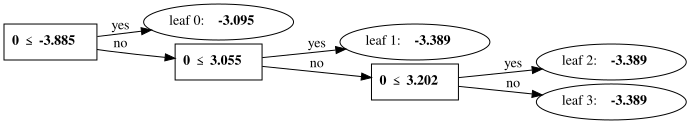

In [19]:
lgb.create_tree_digraph(model)


In [20]:
model._Booster.dump_model()["tree_info"]

[{'tree_index': 0,
  'num_leaves': 4,
  'num_cat': 0,
  'shrinkage': 1,
  'tree_structure': {'split_index': 0,
   'split_feature': 0,
   'split_gain': 2726.1298828125,
   'threshold': -3.884518980979919,
   'decision_type': '<=',
   'default_left': True,
   'missing_type': 'None',
   'internal_value': -3.37908,
   'internal_weight': 0,
   'internal_count': 2817,
   'left_child': {'leaf_index': 0,
    'leaf_value': -3.095107814617691,
    'leaf_weight': 3.265410304069518,
    'leaf_count': 96,
    'leaf_const': -3.095107814617691,
    'leaf_features': [],
    'leaf_coeff': []},
   'right_child': {'split_index': 1,
    'split_feature': 0,
    'split_gain': 2.842169926600864e-14,
    'threshold': 3.0547028779983525,
    'decision_type': '<=',
    'default_left': True,
    'missing_type': 'None',
    'internal_value': -3.3891,
    'internal_weight': 92.554,
    'internal_count': 2721,
    'left_child': {'leaf_index': 1,
     'leaf_value': -3.3890984259027017,
     'leaf_weight': 77.2133478

In [21]:
from sklearn import mixture

X = embeddings

g = mixture.GaussianMixture(
    n_components=6,
    covariance_type="tied",
    reg_covar=1e-20,
    n_init=20,
    max_iter=50
)

g.fit(X)

labels = g.predict(X)

In [22]:
list(zip(labels, original_texts, [original_texts[l] for l in labels]))

[(1, 'rasberry', 'strawberry'),
 (1, 'strawberry', 'strawberry'),
 (1, 'cucumber', 'strawberry'),
 (0, 'programming', 'rasberry'),
 (5, 'building', 'house'),
 (5, 'house', 'house'),
 (5, 'city', 'house'),
 (3, 'society', 'programming'),
 (4, 'barrack', 'building'),
 (5, 'castle', 'house'),
 (5, 'tower', 'house'),
 (0, 'computer', 'rasberry'),
 (3, 'wall', 'programming'),
 (3, 'electricity', 'programming'),
 (3, 'irrigation', 'programming'),
 (3, 'architecture', 'programming'),
 (2, 'noodle', 'cucumber'),
 (2, 'bread', 'cucumber'),
 (2, 'gras', 'cucumber'),
 (3, 'river', 'programming'),
 (2, 'wheat', 'cucumber'),
 (2, 'rice', 'cucumber'),
 (3, 'culture', 'programming'),
 (3, 'nature', 'programming'),
 (2, 'vegetable', 'cucumber'),
 (2, 'onion', 'cucumber'),
 (1, 'fruit', 'strawberry'),
 (2, 'garlic', 'cucumber'),
 (2, 'cheese', 'cucumber'),
 (1, 'melon', 'strawberry'),
 (1, 'grapefruit', 'strawberry')]

In [23]:
embeddings

array([[ 1.99722219,  5.30320311,  1.12571287, ..., -0.41834739,
        -0.78168446,  0.41542456],
       [ 2.43695331,  2.48044014,  0.8084892 , ..., -0.57468712,
         0.50439006,  0.37898409],
       [ 3.76575422,  0.95113426,  0.68368191, ..., -1.08167398,
         1.66979718,  0.08623135],
       ...,
       [ 3.26737261, -1.19184101, -0.9924745 , ...,  1.12462258,
         0.60805917, -0.06991835],
       [ 2.75792813,  2.5215168 ,  1.49386609, ..., -0.7394619 ,
         0.99557042, -0.83330166],
       [ 3.13621831,  2.30888772,  1.78700817, ...,  0.61645305,
        -1.45470107,  0.08149657]])